# Imports

In [1]:
from skimage import io
from sklearn import svm
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix
from sklearn.metrics import balanced_accuracy_score
from sklearn.model_selection import train_test_split
from PIL import Image
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn
from skimage.feature import hog

# Read in Data
Note: this is only image id's, not actual images

In [2]:
koppen = pd.read_csv('../../shared-data/koppen_labels.csv')

In [3]:
koppen.head()

,Unnamed: 0,lat,lon,date,id,climate,symbol
0,0,-26.742391,-49.316425,2007-07-26 10:34:58,1000048060,9,Cfa
1,1,19.413684,-99.171132,2007-08-02 20:11:05,1000123843,16,Cwb
2,2,45.691072,-73.419656,2007-07-29 12:03:16,1000136130,19,Dfb
3,3,35.953900,-105.923609,2007-07-20 17:52:21,1000180545,6,BSk
4,4,47.177885,-68.244720,2007-07-12 16:08:20,1000217295,19,Dfb


In [4]:
classes = {}
general_classes = {}
for pair in koppen[['climate', 'symbol']].values:
    if pair[1] not in classes:
        classes[pair[1]] = [pair[0]]
    elif pair[0] not in classes[pair[1]]:
        classes[pair[1]].append(pair[0])
    if pair[1][0] not in general_classes:
        general_classes[pair[1][0]] = [pair[0]]
    elif pair[0] not in general_classes[pair[1][0]]:
        general_classes[pair[1][0]].append(pair[0])

In [5]:
inv_classes = {}
for climate in classes:
    inv_classes[classes[climate][0]] = climate

In [6]:
(koppen['lat'].values, koppen['lon'].values)

(array([-26.742391,  19.413684,  45.691072, ...,  51.080098,  59.364093,
         33.091996]),
 array([-49.316425, -99.171132, -73.419656, ...,  -4.066357,  17.848877,
        -16.353063]))

In [7]:
lat_long = [(koppen['lat'].values[i],koppen['lon'].values[i], koppen['climate'].values[i]) for i in range(len(koppen['lon'].values))]

In [8]:
from sklearn.utils import resample
import random

In [11]:
colors = ['green', 'pink', 'lightgreen', 'cadetblue', 'lightblue', 'red', 'blue', 'darkblue', 'gray', 'white', 'darkred', 'darkgreen', 'purple', 'beige', 'orange']

In [12]:
colors[100 % len(colors)]

'darkred'

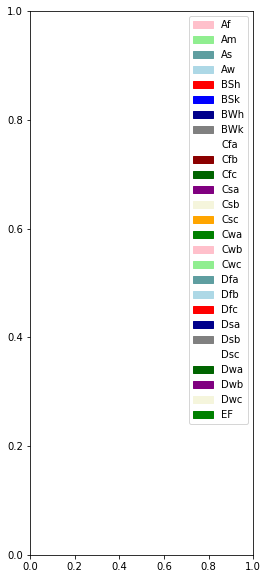

In [13]:
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
patches = []
for i in range(1,31):
    if i != 21 and  i != 25 and  i != 29:
        patch = mpatches.Patch(color=colors[i % len(colors)], label=inv_classes[i])
        patches.append(patch)
plt.figure(figsize = (4,10))
plt.legend(handles=patches)

plt.show()

In [14]:
import folium
mapit = folium.Map(zoom_start=3 )
for coord in resample(lat_long,n_samples = 1000, replace = False):
    folium.Marker( location=[ coord[0], coord[1] ], icon=folium.Icon(icon = 'camera',color=colors[coord[2] % len(colors)]), radius=.0001 ).add_to( mapit )


In [15]:
mapit

In [44]:
koppen['lat'].values.astype(float)

array([-26.742391,  19.413684,  45.691072, ...,  51.080098,  59.364093,
        33.091996])

In [42]:
from bs4 import BeautifulSoup
import urllib
import folium
from folium import plugins

In [47]:
# Using USGS style tile
url_base = 'http://server.arcgisonline.com/ArcGIS/rest/services/'
service = 'NatGeo_World_Map/MapServer/tile/{z}/{y}/{x}'
tileset = url_base + service

m = folium.Map(location=[37.8716, -122.2727], zoom_start=2,\
                control_scale = True, tiles=tileset, attr='USGS style')

# I am using the magnitude as the weight for the heatmap
m.add_child(plugins.HeatMap(zip(koppen['lat'].values.astype(float), koppen['lon'].values.astype(float), np.ones(len(koppen['lon'].values))), radius = 10))


/home/drakejohnson/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  # Remove the CWD from sys.path while we load stuff.
